directly imported from my public kaggle notebook, you can run this by importing it in kaggle or directly cloning the [kaggle notebook](https://www.kaggle.com/code/anshkgoyal/dehazing)

# Import statements

In [1]:
!lscpu

Architecture:             x86_64
  CPU op-mode(s):         32-bit, 64-bit
  Address sizes:          46 bits physical, 48 bits virtual
  Byte Order:             Little Endian
CPU(s):                   4
  On-line CPU(s) list:    0-3
Vendor ID:                GenuineIntel
  Model name:             Intel(R) Xeon(R) CPU @ 2.00GHz
    CPU family:           6
    Model:                85
    Thread(s) per core:   2
    Core(s) per socket:   2
    Socket(s):            1
    Stepping:             3
    BogoMIPS:             4000.43
    Flags:                fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge m
                          ca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht sysc
                          all nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xt
                          opology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq
                           ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt
                           aes xsave avx f16c rdrand hypervisor 

In [2]:
!pip install segmentation-models-pytorch pytorch-lightning


  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 4.8 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16425 sha256=c47da802b77284ae2e5c2e1d737a8e3f70404a03858271d78d66c8de1067b54f
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60944 sha256=478b05bccd9ff4ac23f647276695cf3fffa79e46f0f30e083389211b1d8ac92c
  Stored in directory: /root/.cache/pip/wheels/35/cb/a5/8f534c60142835bfc889f9a482e4a67e0b817032d9c6883b64
Successfully built efficientnet-pytorch pretrainedmodels


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from os.path import join, isfile 
from PIL import Image  # For reading images
from tqdm import tqdm
from os import scandir
import torchvision.io as io
from torchvision.io import read_image, ImageReadMode

import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
from torchvision import transforms
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
from torch.utils.data import DataLoader, Dataset
from pytorch_lightning.callbacks import TQDMProgressBar


# Getting Image Paths
- not using this anymore, only for testing and debug purposes

In [4]:


def get_image_pairs(base_dir, split, verify_filenames=False, verbose=True):
    """
    Retrieves and pairs ground truth and hazy image paths from a specified dataset split.

    Parameters:
    - base_dir (str): The base directory containing the dataset.
                       Example: "/kaggle/input/reside-out/RESIDE OUT"
    - split (str): The dataset split to process ('train' or 'test').
    - verify_filenames (bool): If True, verifies that each GT image corresponds to the correct hazy image based on filename.
    - verbose (bool): If True, prints informative messages during processing.

    Returns:
    - image_pairs_array (np.ndarray): A NumPy array of shape (N, 2), where each row contains the paths
                                      to a GT image and its corresponding hazy image.
    
    Raises:
    - ValueError: If the specified split is invalid or if the number of images doesn't match.
    - FileNotFoundError: If the required directories do not exist.
    """
    # Validate split input
    if split not in ['train', 'test']:
        raise ValueError(f"Invalid split '{split}'. Expected 'train' or 'test'.")

    # Define paths to GT and hazy directories
    gt_dir = join(base_dir, split, "GT")
    hazy_dir = join(base_dir, split, "hazy")

    # Check if GT and hazy directories exist
    if not os.path.isdir(gt_dir):
        raise FileNotFoundError(f"Ground Truth directory not found: {gt_dir}")
    if not os.path.isdir(hazy_dir):
        raise FileNotFoundError(f"Hazy directory not found: {hazy_dir}")

    if verbose:
        print(f"Processing '{split}' split:")
        print(f"  Ground Truth Directory: {gt_dir}")
        print(f"  Hazy Directory: {hazy_dir}")

    # Retrieve list of image filenames in each directory with progress bars
    gt_images = [entry.name for entry in tqdm(scandir(gt_dir), desc="Listing GT files", unit=" files") if entry.is_file()]
    hazy_images = [entry.name for entry in tqdm(scandir(hazy_dir), desc="Listing Hazy files", unit=" files") if entry.is_file()]

    # Sort the lists to ensure corresponding pairs align
    gt_images_sorted = sorted(gt_images)
    hazy_images_sorted = sorted(hazy_images)

    if verbose:
        print(f"  Number of GT images: {len(gt_images_sorted)}")
        print(f"  Number of Hazy images: {len(hazy_images_sorted)}")

    # Verify that both directories have the same number of images
    if len(gt_images_sorted) != len(hazy_images_sorted):
        raise ValueError(f"Mismatch in number of images: {len(gt_images_sorted)} GT images vs {len(hazy_images_sorted)} Hazy images.")

    # (Optional) Verify that corresponding filenames match
    if verify_filenames:
        mismatches = []
        for gt, hazy in zip(gt_images_sorted, hazy_images_sorted):
            if gt != hazy:
                mismatches.append((gt, hazy))
        
        if mismatches:
            mismatch_info = "\n".join([f"GT: {gt} <-> Hazy: {hazy}" for gt, hazy in mismatches])
            raise ValueError(f"Filename mismatches found:\n{mismatch_info}")
        else:
            if verbose:
                print("  All filenames match between GT and Hazy directories.")

    # Create pairs of full image paths
    image_pairs = []
    for gt_image, hazy_image in zip(gt_images_sorted, hazy_images_sorted):
        gt_path = join(gt_dir, gt_image)
        hazy_path = join(hazy_dir, hazy_image)
        image_pairs.append([gt_path, hazy_path])

    # Convert the list of pairs to a NumPy array
    image_pairs_array = np.array(image_pairs, dtype=np.object_)

    if verbose:
        print(f"  Successfully paired {len(image_pairs_array)} images.\n")

    return image_pairs_array

In [5]:
# Define the base directory
base_directory = "/kaggle/input/reside-6k/RESIDE-6K"  

# Process the training split
train_image_pairs = get_image_pairs(base_dir=base_directory, split='train', verify_filenames=True)

# Display sample train image pairs
print("Sample Train Image Pairs:")
print(train_image_pairs[:5])

# Process the testing split
test_image_pairs = get_image_pairs(base_dir=base_directory, split='test', verify_filenames=True)

# Display sample test image pairs
print("Sample Test Image Pairs:")
print(test_image_pairs[:5])


Processing 'train' split:
  Ground Truth Directory: /kaggle/input/reside-6k/RESIDE-6K/train/GT
  Hazy Directory: /kaggle/input/reside-6k/RESIDE-6K/train/hazy


Listing GT files: 6000 files [00:05, 1130.39 files/s]
Listing Hazy files: 6000 files [00:05, 1121.38 files/s]


  Number of GT images: 6000
  Number of Hazy images: 6000
  All filenames match between GT and Hazy directories.
  Successfully paired 6000 images.

Sample Train Image Pairs:
[['/kaggle/input/reside-6k/RESIDE-6K/train/GT/1.jpg'
  '/kaggle/input/reside-6k/RESIDE-6K/train/hazy/1.jpg']
 ['/kaggle/input/reside-6k/RESIDE-6K/train/GT/10.jpg'
  '/kaggle/input/reside-6k/RESIDE-6K/train/hazy/10.jpg']
 ['/kaggle/input/reside-6k/RESIDE-6K/train/GT/100.jpg'
  '/kaggle/input/reside-6k/RESIDE-6K/train/hazy/100.jpg']
 ['/kaggle/input/reside-6k/RESIDE-6K/train/GT/1000.jpg'
  '/kaggle/input/reside-6k/RESIDE-6K/train/hazy/1000.jpg']
 ['/kaggle/input/reside-6k/RESIDE-6K/train/GT/1001.jpg'
  '/kaggle/input/reside-6k/RESIDE-6K/train/hazy/1001.jpg']]
Processing 'test' split:
  Ground Truth Directory: /kaggle/input/reside-6k/RESIDE-6K/test/GT
  Hazy Directory: /kaggle/input/reside-6k/RESIDE-6K/test/hazy


Listing GT files: 1000 files [00:01, 737.58 files/s]
Listing Hazy files: 1000 files [00:01, 729.32 files/s]

  Number of GT images: 1000
  Number of Hazy images: 1000
  All filenames match between GT and Hazy directories.
  Successfully paired 1000 images.

Sample Test Image Pairs:
[['/kaggle/input/reside-6k/RESIDE-6K/test/GT/0001_0.8_0.2.jpg'
  '/kaggle/input/reside-6k/RESIDE-6K/test/hazy/0001_0.8_0.2.jpg']
 ['/kaggle/input/reside-6k/RESIDE-6K/test/GT/0002_0.8_0.08.jpg'
  '/kaggle/input/reside-6k/RESIDE-6K/test/hazy/0002_0.8_0.08.jpg']
 ['/kaggle/input/reside-6k/RESIDE-6K/test/GT/0003_0.8_0.2.jpg'
  '/kaggle/input/reside-6k/RESIDE-6K/test/hazy/0003_0.8_0.2.jpg']
 ['/kaggle/input/reside-6k/RESIDE-6K/test/GT/0004_0.9_0.12.jpg'
  '/kaggle/input/reside-6k/RESIDE-6K/test/hazy/0004_0.9_0.12.jpg']
 ['/kaggle/input/reside-6k/RESIDE-6K/test/GT/0006_0.85_0.08.jpg'
  '/kaggle/input/reside-6k/RESIDE-6K/test/hazy/0006_0.85_0.08.jpg']]


In [6]:
df_train = pd.DataFrame(train_image_pairs, columns=['GT', 'Hazy'])
df_train.to_csv('RESIDE_6k_train.csv', index=False)

df_val = pd.DataFrame(test_image_pairs, columns=['GT', 'Hazy'])
df_val.to_csv('RESIDE_6k_test.csv', index=False)

In [7]:
df = pd.read_csv("/kaggle/working/RESIDE_6k_train.csv")
df.iloc[0,0],df.iloc[0,1]

('/kaggle/input/reside-6k/RESIDE-6K/train/GT/1.jpg',
 '/kaggle/input/reside-6k/RESIDE-6K/train/hazy/1.jpg')

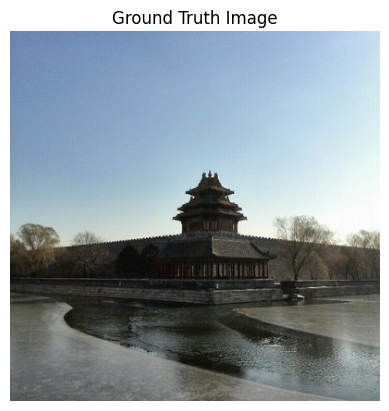

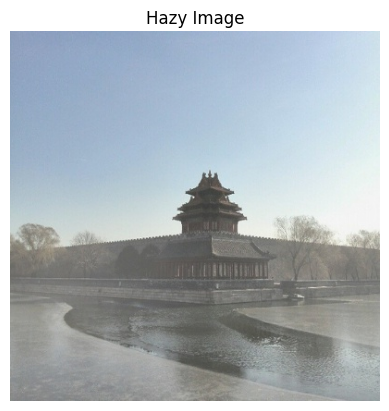

In [8]:


# Load images
image = Image.open(df.iloc[10, 0])  # GT image
image_haze = Image.open(df.iloc[10, 1])  # Hazy image
# Display the GT image
plt.figure()
plt.imshow(image)
plt.axis('off')  # Hide axes
plt.title('Ground Truth Image')
plt.show()

# Display the hazy image
plt.figure()
plt.imshow(image_haze)
plt.axis('off')  # Hide axes
plt.title('Hazy Image')
plt.show()



# Data handling and loaders

In [9]:
train_df = pd.read_csv("/kaggle/input/reside-out/RESIDE_OUT_train.csv")
test_df = pd.read_csv("/kaggle/input/reside-out/RESIDE_OUT_test.csv")
# For train_df
train_df = train_df.apply(lambda x: x.str.replace('/RESIDE OUT/', '/RESIDE OUT/RESIDE OUT/'))

# For test_df
test_df = test_df.apply(lambda x: x.str.replace('/RESIDE OUT/', '/RESIDE OUT/RESIDE OUT/'))



In [10]:

class ImageDataset(Dataset):
    def __init__(self, df, target_size=(384, 384)):
        self.hazy_paths = df['Hazy'].tolist()
        self.gt_paths = df['GT'].tolist()
        self.target_size = target_size
        self.resize_transform = transforms.Resize(self.target_size)

  
    def __len__(self):
        return len(self.hazy_paths)

    def __getitem__(self, idx):
        hazy_path = self.hazy_paths[idx]
        gt_path = self.gt_paths[idx]

        # Load images
        img_x = io.read_image(hazy_path, mode=ImageReadMode.RGB)
        img_y = io.read_image(gt_path, mode=ImageReadMode.RGB)

        

        # Apply resize transformation
        img_x = self.resize_transform(img_x)
        img_y = self.resize_transform(img_y)
            
        # Convert images to float and normalize to [0, 1]
        img_x = img_x.float() / 255.0
        img_y = img_y.float() / 255.0

        
        return img_x, img_y



In [11]:
# Create datasets
train_dataset = ImageDataset(train_df)
val_dataset = ImageDataset(test_df)
# DataLoaders
batch_size = 16  
train_loader = DataLoader(train_dataset, batch_size=batch_size, num_workers=4, shuffle=True,pin_memory=True
                         ,prefetch_factor = 2,persistent_workers=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, num_workers=4,pin_memory=True
                        ,prefetch_factor = 2,persistent_workers=True)

Input Images Shape: torch.Size([4, 3, 384, 384])
Target Images Shape: torch.Size([4, 3, 384, 384])
Input Images Range: 0.14509804546833038 - 0.9960784316062927
Target Images Range: 0.0 - 1.0


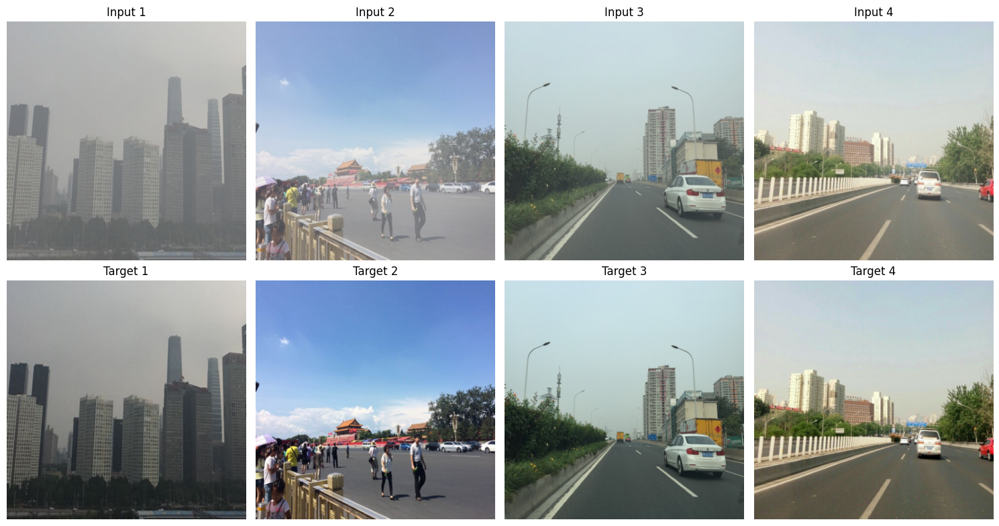


Testing memory management...
First batch shapes: torch.Size([4, 3, 384, 384]), torch.Size([4, 3, 384, 384])
Processed 0 batches
Processed 100 batches
Processed 200 batches

Single Item Test:
Input image tensor shape: torch.Size([3, 384, 384])
Target image tensor shape: torch.Size([3, 384, 384])
Input image value range: 0.09019608050584793 - 0.9882352948188782
Target image value range: 0.007843137718737125 - 1.0

Checking first few paths:
Hazy path exists: True
GT path exists: True


In [12]:
# Testing ImageDataset

def test_dataset(train_df):
    # Load your DataFrame
    
   
    
    dataset = ImageDataset(train_df)
    
    # Create DataLoader with a small batch size
    dataloader = DataLoader(dataset, batch_size=4, shuffle=True)
    
    # Get a batch of images
    images, targets = next(iter(dataloader))
    
    # Print shapes and value ranges
    print("Input Images Shape:", images.shape)
    print("Target Images Shape:", targets.shape)
    print("Input Images Range:", images.min().item(), "-", images.max().item())
    print("Target Images Range:", targets.min().item(), "-", targets.max().item())
    
    # Visualize some samples
    fig, axes = plt.subplots(2, 4, figsize=(15, 8))
    
    # Convert tensors to numpy for visualization
    for i in range(4):
        # Display input images
        img = images[i].permute(1, 2, 0).numpy()
        axes[0, i].imshow(img)
        axes[0, i].axis('off')
        axes[0, i].set_title(f'Input {i+1}')
        
        # Display target images
        target = targets[i].permute(1, 2, 0).numpy()
        axes[1, i].imshow(target)
        axes[1, i].axis('off')
        axes[1, i].set_title(f'Target {i+1}')
    
    plt.tight_layout()
    plt.show()
    
    # Test memory management
    print("\nTesting memory management...")
    for i, (batch_x, batch_y) in enumerate(dataloader):
        if i == 0:
            print(f"First batch shapes: {batch_x.shape}, {batch_y.shape}")
        if i % 100 == 0:
            print(f"Processed {i} batches")
        if i >= 200:  # Test first 200 batches
            break

# Run the test
test_dataset(train_df)

# Additional specific tests
def test_single_item(train_df):
    dataset = ImageDataset(train_df)
    
    # Test first item
    img_x, img_y = dataset[0]
    
    print("\nSingle Item Test:")
    print("Input image tensor shape:", img_x.shape)
    print("Target image tensor shape:", img_y.shape)
    print("Input image value range:", img_x.min().item(), "-", img_x.max().item())
    print("Target image value range:", img_y.min().item(), "-", img_y.max().item())
    
    # Check if paths exist
    print("\nChecking first few paths:")
    print("Hazy path exists:", os.path.exists(dataset.hazy_paths[0]))
    print("GT path exists:", os.path.exists(dataset.gt_paths[0]))

# Run additional tests
test_single_item(train_df)


# Model Architecture

The `PerceptualLoss` class utilizes features from pre-trained VGG16 layers (conv1_2, conv2_2, conv3_3) to measure the perceptual similarity between output and target images, enhancing the model's ability to capture higher-level features.

The `LitUModel` class implements a U-Net architecture with a MobileNetV2 encoder, pre-trained on ImageNet, and uses a combination of MSE, L1, and perceptual losses, weighted as 0.2, 0.4, and 0.4 respectively, to balance pixel-level accuracy and perceptual fidelity.

In [13]:
class PerceptualLoss(nn.Module):
    def __init__(self):
        super().__init__()
        # Using VGG16 features for perceptual loss
        vgg = models.vgg16(weights='VGG16_Weights.DEFAULT').features
        self.blocks = nn.ModuleList([
            vgg[:4],  # conv1_2
            vgg[4:9],  # conv2_2
            vgg[9:16],  # conv3_3
        ])

        # Register normalization parameters
        self.register_buffer('mean', torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1))
        self.register_buffer('std', torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1))
        
        for bl in self.blocks:
            for p in bl.parameters():
                p.requires_grad = False
            bl.eval()

    def normalize(self, x):
        return (x - self.mean) / self.std
        
    def forward(self, x, y):

        # Normalize both inputs
        x = self.normalize(x)
        y = self.normalize(y)
        
        loss = 0
        for block in self.blocks:
            x = block(x)
            y = block(y)
            loss += F.l1_loss(x, y)
        return loss




class LitUModel(pl.LightningModule):
    def __init__(self, learning_rate=1e-4, weight_decay=1e-5):
        super(LitUModel, self).__init__()
        
        self.model = smp.Unet(
            encoder_name='mit_b3',
            encoder_weights='imagenet',
            in_channels=3,
            classes=3,
            activation='sigmoid')
        self.learning_rate = learning_rate
        self.weight_decay = weight_decay

        # Loss components
        self.mse_loss = nn.MSELoss()
        self.l1_loss = nn.L1Loss()
        self.perceptual_loss = PerceptualLoss()
        
        # Loss weights
        self.lambda_mse = 0.2
        self.lambda_l1 = 0.4
        self.lambda_perceptual = 0.4

    def forward(self, x):
        return self.model(x)


    def compute_total_loss(self, outputs, targets):
        # MSE Loss
        mse = self.mse_loss(outputs, targets)
        
        # L1 Loss
        l1 = self.l1_loss(outputs, targets)
        
        # Perceptual Loss
        perceptual = self.perceptual_loss(outputs, targets)
        
        # Total weighted loss
        total_loss = (self.lambda_mse * mse + 
                     self.lambda_l1 * l1 + 
                     self.lambda_perceptual * perceptual)
        
        return total_loss, mse, l1, perceptual

    
    def training_step(self, batch, batch_idx):
        images, targets = batch
        outputs = self(images)
        total_loss, mse, l1, perceptual = self.compute_total_loss(outputs, targets)
        
        # Log all losses
        self.log('train_total_loss', total_loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log('train_mae', l1, prog_bar=True, on_epoch=True)
        return total_loss

    def validation_step(self, batch, batch_idx):
        images, targets = batch
        outputs = self(images)
        total_loss, mse, l1, perceptual = self.compute_total_loss(outputs, targets)
        
        # Log all losses
        self.log('val_total_loss', total_loss, prog_bar=True, on_epoch=True)
        self.log('val_l1', l1, prog_bar=True, on_epoch=True)
        return total_loss

    def configure_optimizers(self):
        optimizer = optim.AdamW(self.parameters(), lr=self.learning_rate,weight_decay=self.weight_decay)
        return optimizer

# Training model using pytorch lightning

In [14]:
model = LitUModel()

Downloading: "https://github.com/qubvel/segmentation_models.pytorch/releases/download/v0.0.2/mit_b3.pth" to /root/.cache/torch/hub/checkpoints/mit_b3.pth
100%|██████████| 170M/170M [00:01<00:00, 141MB/s] 
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 231MB/s]  


In [39]:
class CustomProgressBar(TQDMProgressBar):
    def init_validation_tqdm(self):
        # Return a disabled tqdm progress bar to prevent errors
        bar = tqdm(disable=True)
        return bar

    # Optional: Do the same for test and predict if needed
    def init_test_tqdm(self):
        bar = tqdm(disable=True)
        return bar

    def init_predict_tqdm(self):
        bar = tqdm(disable=True)
        return bar
progress_bar = CustomProgressBar(refresh_rate=1,leave=True)


trainer = pl.Trainer(
    max_epochs=4,
    accelerator='auto',
    devices='auto',  # Use 'auto' if devices=8 causes issues
    callbacks=[progress_bar],
    precision='16-mixed',
    limit_train_batches=800
)


In [16]:
!rm -rf /kaggle/working/

rm: cannot remove '/kaggle/working/': Device or resource busy


In [17]:
!ls lightning_logs/version_2/checkpoints
#,ckpt_path="/kaggle/working/lightning_logs/version_2/checkpoints/epoch=4-step=1000.ckpt"

ls: cannot access 'lightning_logs/version_2/checkpoints': No such file or directory


In [40]:
trainer.fit(model, train_loader, val_loader)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

1280,0701,0501,0471,0405 ,0387, 0372,0361,0359,0350,0340,0331,0326,0320,0318,0307,0305, 0300, 0295, 0290, 0293, 0284,0283,0281

- ...., 0254,0242,0237, ...., 0.0189,0.0186,178,176(lowest)

# Comparing predicted output

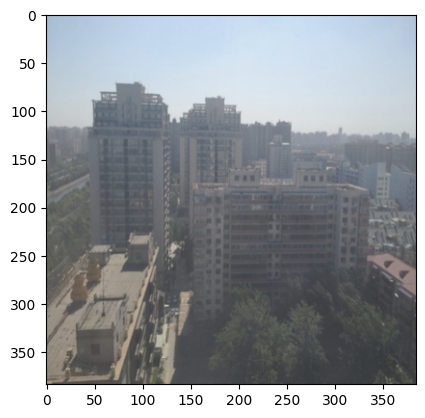

In [ ]:
import torch
img_x = io.read_image("/kaggle/input/reside-out/RESIDE OUT/RESIDE OUT/test/hazy/0002_0.8_0.08.jpg", mode=ImageReadMode.RGB)

default_transform = transforms.Compose([
                transforms.Resize((384,384))
            ])
img_x = default_transform(img_x)/255.
plt.imshow(np.transpose(img_x.detach().numpy(),[1,2,0]))


debug cell below


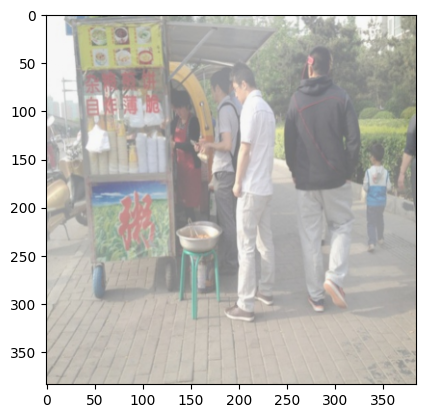

In [51]:
import torch
img_x = io.read_image("/kaggle/input/reside-out/RESIDE OUT/RESIDE OUT/test/hazy/1059_0.95_0.2.jpg", mode=ImageReadMode.RGB)
default_transform = transforms.Compose([
                transforms.Resize((384,384))
            ])
img_x = default_transform(img_x)/255.
plt.imshow(np.transpose(img_x.detach().numpy(),[1,2,0]))


torch.Size([1, 3, 384, 384])


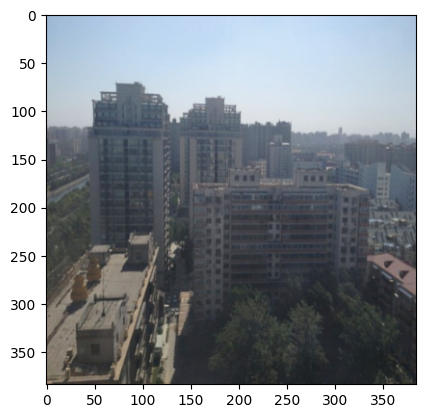

In [42]:
model.eval()
with torch.no_grad():
    img = model(torch.unsqueeze(img_x,dim=0))
    print(img.shape)
plt.imshow(np.transpose(torch.squeeze(img,dim=0).detach().numpy(),[1,2,0]))

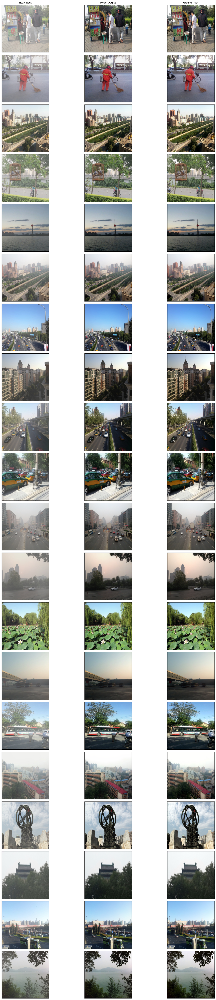

In [52]:
import pandas as pd
import os
import matplotlib.pyplot as plt
from torchvision.io import read_image

# Load CSV dataset
test_dataset = pd.read_csv("/kaggle/input/reside-out/RESIDE_OUT_test.csv")

# Select 20 random samples
random_samples = test_dataset.sample(20, random_state=42)

# Create figure
fig, axes = plt.subplots(20, 3, figsize=(15, 60))

# Define transformations
transform = transforms.Compose([
    transforms.Resize((384, 384)),
    transforms.ConvertImageDtype(torch.float)
])

# Set model to eval mode
model.eval()
device = next(model.parameters()).device

def correct_path(csv_path):
    """Fix the directory structure by adding missing 'RESIDE OUT'"""
    return csv_path.replace(
        "/RESIDE OUT/test/", 
        "/RESIDE OUT/RESIDE OUT/test/", 
        1
    )

# Process images
for idx, (_, row) in enumerate(random_samples.iterrows()):
    try:
        # Get and correct paths
        hazy_path = correct_path(row['Hazy'])
        gt_path = correct_path(row['GT'])
        
        # Verify paths
        if not os.path.exists(hazy_path):
            raise FileNotFoundError(f"Hazy image missing: {hazy_path}")
        if not os.path.exists(gt_path):
            raise FileNotFoundError(f"GT image missing: {gt_path}")

        # Read and transform images
        img_hazy = transform(read_image(hazy_path, ImageReadMode.RGB))
        img_gt = transform(read_image(gt_path, ImageReadMode.RGB))
        
        # Model inference
        with torch.no_grad():
            output = model(img_hazy.unsqueeze(0).to(device)).cpu()
            output = torch.clamp(output, 0, 1)
        
        # Display images
        axes[idx, 0].imshow(img_hazy.permute(1, 2, 0).numpy())
        axes[idx, 1].imshow(output.squeeze().permute(1, 2, 0).numpy())
        axes[idx, 2].imshow(img_gt.permute(1, 2, 0).numpy())
        
        # Formatting
        for ax in axes[idx]:
            ax.set_xticks([])
            ax.set_yticks([])
            
        if idx == 0:
            axes[idx, 0].set_title('Hazy Input', fontsize=10)
            axes[idx, 1].set_title('Model Output', fontsize=10)
            axes[idx, 2].set_title('Ground Truth', fontsize=10)

    except Exception as e:
        print(f"Skipping row {idx} due to error: {str(e)}")
        continue

plt.tight_layout()
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()